# FINAL PROJECT MACHINE LEARNING 2

## IMPORTING NECESSARY LIBRARIES AND MODULES

In [41]:
import numpy as np
import pandas as pd
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import LSTM
import os
import cv2
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from keras.layers import Dense, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import RMSprop
from sklearn.model_selection import GridSearchCV
from keras import layers,models
from scikeras.wrappers import KerasClassifier
import keras_tuner as kt
import tensorflow as tf
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.callbacks import EarlyStopping
import keras
from keras.utils import to_categorical
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns
from sklearn.metrics import classification_report 
import pandas as pd
from keras.utils import plot_model
import pydot
import graphviz
import pydotplus
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import KFold
from keras.utils import to_categorical
import shutil
from keras.models import Model
from keras.layers import Input, Conv2D, GlobalAveragePooling2D, Dense
from keras.applications.vgg16 import VGG16
from sklearn.metrics import accuracy_score
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Bidirectional,Embedding, LSTM, GRU, Dense, concatenate, Input
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from contractions import fix
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from string import punctuation
from unidecode import unidecode
from sklearn.preprocessing import LabelEncoder
from transformers import BertTokenizer, BertForSequenceClassification
from kerastuner.tuners import RandomSearch
from sklearn.ensemble import StackingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
import nltk
from keras.layers import Embedding
from tensorflow.keras.utils import plot_model
from transformers import DistilBertTokenizer, TFDistilBertForSequenceClassification
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint
import graphviz
import xgboost as xgb
from xgboost import plot_tree

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\39324\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


## IMPORTING AND SHOWING DATA

In [42]:
#READ THE CSV FILE
file_path = 'youtube.csv'
df = pd.read_csv(file_path)

In [43]:
#SHOW THE DATAFRAME
df

,link,title,description,category
0,JLZlCZ0,Ep 1| Travelling through North East India | Of...,Tanya Khanijow\n671K subscribers\nSUBSCRIBE\nT...,travel
1,i9E_Blai8vk,Welcome to Bali | Travel Vlog | Priscilla Lee,Priscilla Lee\n45.6K subscribers\nSUBSCRIBE\n*...,travel
2,r284c-q8oY,My Solo Trip to ALASKA | Cruising From Vancouv...,Allison Anderson\n588K subscribers\nSUBSCRIBE\...,travel
3,Qmi-Xwq-ME,Traveling to the Happiest Country in the World!!,Yes Theory\n6.65M subscribers\nSUBSCRIBE\n*BLA...,travel
4,_lcOX55Ef70,Solo in Paro Bhutan | Tiger's Nest visit | Bhu...,Tanya Khanijow\n671K subscribers\nSUBSCRIBE\nH...,travel
...,...,...,...,...
3594,#NAME?,21st Century Challenges: Crash Course European...,CrashCourse\n12.4M subscribers\nSUBSCRIBE\nThe...,history
3595,d-2Trw8bCa0,EU DataViz webinar - Barnaby Skinner - How to ...,Publications Office of the European Union\n3.2...,history
3596,RCKWarkUL,Stone Age Scandinavia: First People In the Nor...,History Time\n619K subscribers\nSUBSCRIBE\n- W...,history
3597,MF6F3BxJIY,AP European History - Interwar Period: Paris P...,Mr. Raymond's Civics and Social Studies Academ...,history


In [44]:
#CHECKING IF THERE ARE OTHER NANS
nan_count_in_text = df['description'].isna().sum()
nan_count_in_text

0

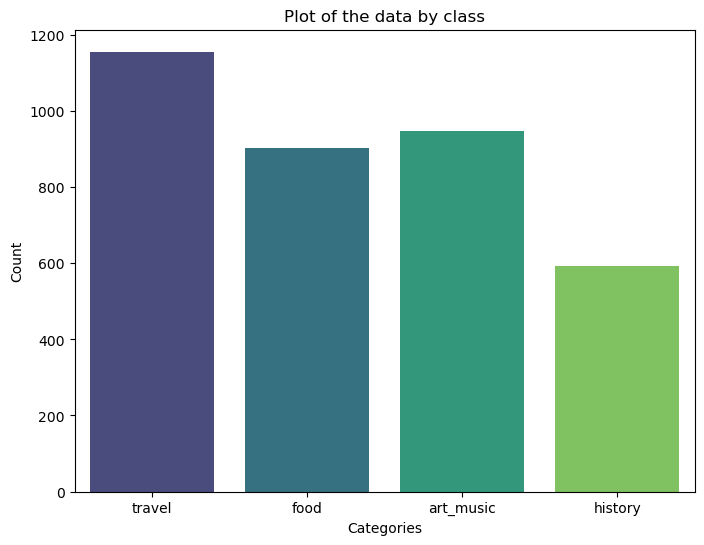

In [45]:
#PLOT OF THE NUMBER OF VIDEOS PER LABEL
plt.figure(figsize=(8, 6))
sns.countplot(x='category', data=df, palette='viridis')
plt.title('Plot of the data by class')
plt.xlabel('Categories')
plt.ylabel('Count')
plt.show()

## DATA PRE-PROCESSING

In [46]:
#ENGLISH STOPWORDS
stopword_list = stopwords.words("english")

In [47]:
#FUNCTION REMOVE BLANK SPACES, EXPAND TEXT, HANDLE ACCENTED CHARACTERS STOP WORDS REMOVAL, LEMMATIZATION
def data_preprocessing(text):
    # Remove blank characters and tavs
    text = text.replace("\n", "").replace("\t", "")

    # Expanding text 
    #expand words in this way: like can't in cannot and don't in do not
    text = fix(text)

    # Handle accented characters: replacing with non accented equivalents
    text = unidecode(text)

    # Clean text
    #convert text to lowercase
    text = text.lower()
    #tokenize text
    tokens = word_tokenize(text)
    #I have now a list of tokens in which:
    #I Remove words that start with "subscriberssubscribe" from the list of tokens as they give no information
    tokens = [word for word in tokens if not word.startswith("subscriberssubscribe")]
    #Remove information
    clean_data = [i for i in tokens if i not in punctuation]
    #remove stopwords 
    clean_data = [i for i in clean_data if i not in stopword_list]
    #remove non-alphabetic words
    clean_data = [i for i in clean_data if i.isalpha()]
    #remove words with a length less than or equal 1
    clean_data = [i for i in clean_data if len(i) > 1]

    # Lemmatization
    #initialization
    lemmatizer = WordNetLemmatizer()
    #lemmatizing words to standardize it: reduce tokens in their base root form
    final_list = [lemmatizer.lemmatize(word) for word in clean_data]

    return " ".join(final_list)

In [48]:
#DATA WHICH WILL BE USED AS INPUT
data=df['description']

In [49]:
data[0]

'Tanya Khanijow\n671K subscribers\nSUBSCRIBE\nThe journey to Arunachal, North East India begins with a train journey from Guwahati to Murkongselek. From here we head to Pasighat. And I and my travel companions are just getting started by exploring the tiny glimpse of Arunachal that we have so far. From markets to bridges, the adventure will only get better from here. :)\n\nNext Video: \nSHOW MORE'

In [50]:
#APPLY PREPROCESSING TO EVERY DOCUMENT
clean_data = data.apply(data_preprocessing)

In [51]:
clean_data[0]

'tanya journey arunachal north east india begin train journey guwahati murkongselek head pasighat travel companion getting started exploring tiny glimpse arunachal far market bridge adventure get better next video show'

In [52]:
#ADD A NEW COLUMN TO THE DATAFRAME WITH CLEANED DATA
df['text']=clean_data

In [53]:
df

,link,title,description,category,text
0,JLZlCZ0,Ep 1| Travelling through North East India | Of...,Tanya Khanijow\n671K subscribers\nSUBSCRIBE\nT...,travel,tanya journey arunachal north east india begin...
1,i9E_Blai8vk,Welcome to Bali | Travel Vlog | Priscilla Lee,Priscilla Lee\n45.6K subscribers\nSUBSCRIBE\n*...,travel,priscilla disclaimer please ride elephant visi...
2,r284c-q8oY,My Solo Trip to ALASKA | Cruising From Vancouv...,Allison Anderson\n588K subscribers\nSUBSCRIBE\...,travel,allison spent day cruising coast alaska magica...
3,Qmi-Xwq-ME,Traveling to the Happiest Country in the World!!,Yes Theory\n6.65M subscribers\nSUBSCRIBE\n*BLA...,travel,yes black friday drop http week every purchase...
4,_lcOX55Ef70,Solo in Paro Bhutan | Tiger's Nest visit | Bhu...,Tanya Khanijow\n671K subscribers\nSUBSCRIBE\nH...,travel,tanya presenting first part bhutan series epis...
...,...,...,...,...,...
3594,#NAME?,21st Century Challenges: Crash Course European...,CrashCourse\n12.4M subscribers\nSUBSCRIBE\nThe...,history,century brought whole new host challenge world...
3595,d-2Trw8bCa0,EU DataViz webinar - Barnaby Skinner - How to ...,Publications Office of the European Union\n3.2...,history,publication office european new era data visua...
3596,RCKWarkUL,Stone Age Scandinavia: First People In the Nor...,History Time\n619K subscribers\nSUBSCRIBE\n- W...,history,history watch latest full length history docum...
3597,MF6F3BxJIY,AP European History - Interwar Period: Paris P...,Mr. Raymond's Civics and Social Studies Academ...,history,raymond civics social study european history i...


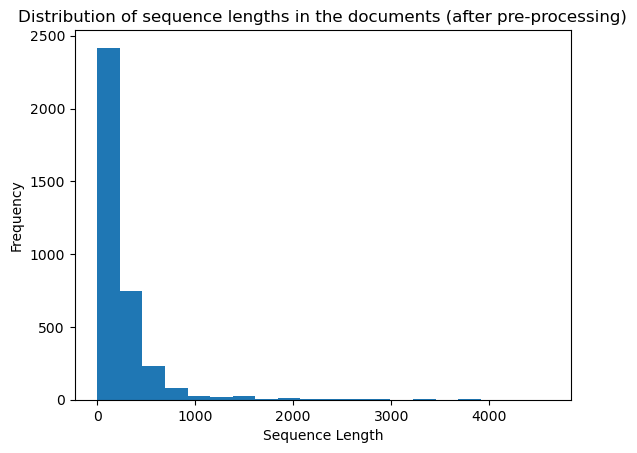

In [92]:
# LIST CONTAINING THE LENGTH OF EVERY DOCUMENT (NUMBER OF WORDS IN EVERY VIDEO DESCRIPTION CLEANED)
sequence_lengths = [len(seq) for seq in clean_data]

# HISTOGRAM PLOT TO VISUALIZE THE DISTRIBUTION OF THE LENGTH OF THE SEQUENCE OF WORDS IN DOCUMENTS
plt.hist(sequence_lengths, bins=20)
plt.title('Distribution of sequence lengths in the documents (after pre-processing)')
plt.xlabel('Sequence Length')
plt.ylabel('Frequency')
plt.show()

In [55]:
#USE OF VALUES TO CREATE ARRAYS FOR VARIABLE TEXT AND LABELS
X = df['text'].values
y = df['category'].values

In [56]:
X

array(['tanya journey arunachal north east india begin train journey guwahati murkongselek head pasighat travel companion getting started exploring tiny glimpse arunachal far market bridge adventure get better next video show',
       'priscilla disclaimer please ride elephant visiting country time know yes dumb shown video support elephant riding business anymore could take back would instead want pas knowledge anyone aware info show',
       'allison spent day cruising coast alaska magical alaska blog post http adventure instagram http',
       ..., 'history watch latest full length history documentary',
       'raymond civics social study european history interwar period treaty versailles rise totalitarianism morefor social study resource check http show',
       'paul video cover wartime conference held ally world war conference focused war fought created framework peace shaped postwar world also created foundation cold war would follow let u say pretty darn'],
      dtype=object)

In [57]:
len(df['text'].values)

3599

In [58]:
len(y)

3599

In [212]:
# DATA SPLITTED INTO TRAINING (70%) AND TEMPORARY SET (30%)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)

# TEMPORARY SET SPLIT TO HOLDOUT (50%) AND TEST SET (50%)
X_holdout, X_test, y_holdout, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)


In [60]:
#CHECK OF THE NUMBER OF ELEMENTS FOR EACH SET
print(len(X_train))
print(len(X_holdout))
print(len(X_test))

2519
540
540


In [153]:
#NUM OF ELEMENTS BY CLASS PER EACH SET
from collections import Counter
class_counts_train = Counter(y_train)
class_counts_holdout = Counter(y_holdout)
class_counts_test = Counter(y_test)

# Print the counts
print("Class counts in y_train:", class_counts_train)
print("Class counts in y_holdout:", class_counts_holdout)
print("Class counts in y_test:", class_counts_test)

Class counts in y_train: Counter({3: 776, 0: 690, 1: 639, 2: 414})
Class counts in y_holdout: Counter({3: 190, 1: 130, 0: 128, 2: 92})
Class counts in y_test: Counter({3: 190, 1: 134, 0: 129, 2: 87})


In [61]:
#TEXT DATA TOKENIZATION
#DATA CONVERTED INTO INTEGERS
#maximum number of words kept in the vocabulary, OOV tokenas are the words outside the limit
#not the most important ones but the most FREQUENT ones
max_words = 100000 
#creating the tokenizer object
tokenizer = Tokenizer(num_words=max_words, oov_token='<OOV>')
#updating the internal vocabylary of the tkenizer based on the words in the training data
tokenizer.fit_on_texts(X_train)

In [62]:
#APPLY TOKENIZATION TO THE DATASET TO CONVERT SEQUENCES OF WORDS IN SEQUENCES OF INTEGERS
X_train_sequences = tokenizer.texts_to_sequences(X_train)
X_holdout_sequences = tokenizer.texts_to_sequences(X_holdout)
X_test_sequences = tokenizer.texts_to_sequences(X_test)

In [63]:
X_train

array(['live radio musicsubscribehits radio live radio pop music hit best english song new popular song live stream please check forget hit thatand subscribe button enjoyy http live radio station online live radio music live music streamlive radio canli radyo dinlewelcome channel live radio music channel youtube suggests listening best radio station online radyo live listen following best pop music playlist original latest top hit radio new pop song world playlist best song fenomen pop song live radio dance radio live streamhits music playlist pop hit playlist pop song time playlisttoday hit spotify playlist top hit hit best pop edm urban pop song best new hit today top music playlistbest radio live radio pop music best english song time new popular song le',
       'brother brothersfromghana ghanaianduotravellers travelbloggers dubaivlogit awhile chitchat ghanaian duo traveller brother ghana get ready upcoming segment dubbed brother kindly subscribe channel turn notification get first

In [64]:
X_train_sequences

[[66,
  113,
  2729,
  113,
  66,
  113,
  19,
  9,
  16,
  13,
  24,
  2,
  10,
  47,
  2,
  66,
  313,
  29,
  103,
  50,
  16,
  1572,
  15,
  356,
  1573,
  7,
  66,
  113,
  290,
  261,
  66,
  113,
  9,
  66,
  9,
  2006,
  113,
  2007,
  1015,
  2730,
  18,
  66,
  113,
  9,
  18,
  48,
  1750,
  1291,
  13,
  113,
  290,
  261,
  1015,
  66,
  119,
  660,
  13,
  19,
  9,
  36,
  534,
  67,
  22,
  16,
  113,
  10,
  19,
  2,
  33,
  36,
  13,
  2,
  2008,
  19,
  2,
  66,
  113,
  207,
  113,
  66,
  2009,
  9,
  36,
  19,
  16,
  36,
  19,
  2,
  25,
  2010,
  16,
  256,
  36,
  22,
  16,
  16,
  13,
  19,
  1016,
  1574,
  19,
  2,
  13,
  10,
  16,
  62,
  22,
  9,
  2011,
  113,
  66,
  113,
  19,
  9,
  13,
  24,
  2,
  25,
  10,
  47,
  2,
  204],
 [792,
  6739,
  6740,
  6741,
  6742,
  6743,
  6744,
  6745,
  3385,
  698,
  792,
  6746,
  39,
  946,
  1017,
  3386,
  2326,
  792,
  2327,
  15,
  18,
  661,
  622,
  39,
  34,
  25,
  54,
  23,
  2327,
  357,
  83,
  77,

In [65]:
len(X_train_sequences[0])

122

In [66]:
#TO GET UNIFORM LENGTH OF THE DOCUMENTS DATA IS PADDED
#TO MAKE SURE EVERY DOCUMENT HAS THE SAME NUMBER OF INTEGERS RELATIVE TO WORDS
max_sequence_length = 1000 
X_train_padded = pad_sequences(X_train_sequences, maxlen=max_sequence_length, padding='post', truncating='post')
X_holdout_padded = pad_sequences(X_holdout_sequences, maxlen=max_sequence_length, padding='post', truncating='post')
X_test_padded = pad_sequences(X_test_sequences, maxlen=max_sequence_length, padding='post', truncating='post')

In [67]:
#i will get a matrix (2 dim array) of integers with number of rows=number of documents and number of columns=1000
X_train_padded

array([[   66,   113,  2729, ...,     0,     0,     0],
       [  792,  6739,  6740, ...,     0,     0,     0],
       [  449,  6747,    16, ...,     0,     0,     0],
       ...,
       [ 3298,  6370, 15240, ...,     0,     0,     0],
       [  145,     4,  1924, ...,     0,     0,     0],
       [  298,  2325,  4077, ...,     0,     0,     0]])

In [68]:
y_train

array(['art_music', 'travel', 'art_music', ..., 'travel', 'history',
       'history'], dtype=object)

In [69]:
#NOW THE DEPENDENT VARIABLE IS ADJUSTED
#WITH LABEL ENCODER TEXT CATEGORIES ARE CONVERTED INTO NUMBERS
label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(y_train)
y_holdout = label_encoder.fit_transform(y_holdout)
y_test = label_encoder.fit_transform(y_test)

In [70]:
#THEN LABELS ARE ONE-HOT ENCODED 
#i will get an array with a matrix (2 dim vector) with number of rows= num of dcouments and 4 columns, every value is 0 except for the one related for the specific class (1)
y_train= to_categorical(y_train, num_classes=4)
y_holdout = to_categorical(y_holdout, num_classes=4)
y_test = to_categorical(y_test, num_classes=4)

In [71]:
y_train

array([[1., 0., 0., 0.],
       [0., 0., 0., 1.],
       [1., 0., 0., 0.],
       ...,
       [0., 0., 0., 1.],
       [0., 0., 1., 0.],
       [0., 0., 1., 0.]], dtype=float32)

## BUILDING THE MODELS

In [72]:
#LOADING GLOVE MODEL THROUGH A FUNCTION
#TYPE OF PRETRAINED WORD EMBEDDING
#glove model is loaded from a specific path
def load_glove_model(file_path):

    print(f"Loading GloVe model from {file_path}...")
    #empty dictionary
    word_vectors = {}
    #file is opened and saved as file
    with open(file_path, 'r', encoding='utf-8') as file:
        #for every line in the file
        for line in file:
            #line splitted into a list of strings using whitespace as the delimiter and assigned to the variable values
            values = line.split()
            #thw word is the first element of the values list
            word = values[0]
            #then the other elements of the value list are the elements that will be in the vector associated with the word
            vector = np.array(values[1:], dtype='float32')
            #an entry is added to the dictionary created before: word is the key and vector the value
            word_vectors[word] = vector
    
    print(f"Loaded {len(word_vectors)} word vectors.")
    #return a dictionary mapping words to their specific vectors
    return word_vectors

# Replace 'path/to/glove.6B.300d.txt' with the actual path to your downloaded GloVe file
glove_file_path = "C:/Users/39324/OneDrive/Documenti/BIG_PROJECT_ML2_FOLDER/glove.6B.50d.txt"
glove_model = load_glove_model(glove_file_path)

# Example usage to see the vector related to the word city
word_embedding = glove_model.get('city')  
print(f"Embedding for 'city': {word_embedding}")


Loading GloVe model from C:/Users/39324/OneDrive/Documenti/BIG_PROJECT_ML2_FOLDER/glove.6B.50d.txt...
Loaded 400000 word vectors.
Embedding for 'city': [ 0.43945   0.43268  -0.36654   0.27781   0.062932 -0.80201  -0.93041
  0.016388 -0.5503   -0.16278  -0.40351  -1.3975    0.32079  -0.88954
 -0.18853   0.11516   0.045326  0.83002  -0.87595   0.77653   0.55948
  0.074721 -0.84672   0.4098   -0.59774  -2.062    -0.15894   0.57979
  0.2827   -1.0213    3.2488    0.50029   0.11559  -1.1707    0.19016
  0.36888  -0.042018  0.028234  0.54125   0.8489   -0.66711   0.60799
  0.23787  -0.65378  -0.7055    0.5165   -1.078    -0.71524   0.48402
 -0.3256  ]


In [73]:
#size of the vectors of every word in the loaded glove model
vector_size = len(next(iter(glove_model.values())))
#number of words of the model
num_words = len(glove_model)
print(vector_size)
print(num_words)

50
400000


In [74]:
#creation of the embedding matrix for the glove model
#matrix to store word embeddings is initialised, with the dimensions of the glove pre-trained model
embedding_matrix = np.random.rand(num_words, vector_size)
#iteration through each word in the dictionary and assignment to the varible word
for word, i in zip(glove_model.keys(), range(num_words)):
    if word in glove_model:
        #if the word is present in the glove dictionary, it's corresponding word embedding is assigned to the i-th row in the embedding matrix
        embedding_matrix[i] = glove_model[word]

#same block of code iterating over each word in the tokenizer.word_index dictionary, if the word is present in the glove dictionary then the corresponding embedding is assigned, otherwise a radnom vector is generated
for word, i in tokenizer.word_index.items():
    if word in glove_model:
        embedding_matrix[i] = glove_model[word]
    else:
        
        embedding_matrix[i] = np.random.rand(vector_size)

### LSTM BASE MODEL

In [75]:
#directory to delete the folder with the results of the model in case needed to start again
directory_to_delete = 'keras_tuner_dir_lstm'
shutil.rmtree(directory_to_delete)

In [76]:
#function to build the lstm model (base model)
def build_model_lstm(hp):
    model_lstm = Sequential()
    
    #hyperparameter vactorization type to use for input data
    vectorization_type = hp.Choice('vectorization_type', values=['embedding', 'glove'])
    
    #standard embedding case 
    if vectorization_type == 'embedding':
        #choice of hyperparameter maximum number of words
        max_words = hp.Choice('max_words_embedding', values=[50000, 100000])
        ##choice of hyperparameter embedding dim
        embedding_dim = hp.Choice('embedding_dim_embedding', values=[50, 100])
        #printing info about the type used and hp value
        print(f'Embedding case - max_words: {max_words}, embedding_dim: {embedding_dim}')
        model_lstm.add(Embedding(input_dim=max_words,
                            output_dim=embedding_dim,
                            input_length=max_sequence_length))
    else:
        #hyperparametersmaximum number of words parameter is already defined
        max_words = 400000
        embedding_dim = 50
        print(f'Glove case - max_words: {max_words}, embedding_dim: {embedding_dim}')
        model_lstm.add(Embedding(input_dim=max_words,
                                 output_dim=embedding_dim,
                                 weights=[embedding_matrix],  
                                 input_length=max_sequence_length,
                                 #weights not updated dureing training, pre-trained embedding 
                                 trainable=False)) 
    model_lstm.add(Bidirectional(LSTM(units=hp.Choice('lstm_units', values=[32, 64,128]),
                                 return_sequences=False,
                                 dropout=hp.Choice('dropout', values=[0.3, 0.5]),
                                 recurrent_dropout=hp.Choice('recurrent_dropout', values=[0.3, 0.5]))))
    
    model_lstm.add(Dense(units=4, activation="softmax"))

    model_lstm.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    return model_lstm

#initialisation of the tuner to find the best combination of hp
tuner_lstm = RandomSearch(
    build_model_lstm,
    objective='val_accuracy',
    max_trials=10,
    directory='keras_tuner_dir_lstm',
    project_name='lstm_hyperparameter_tuning'
)



n_folds = 5  
#kf object to divide data in training+validation, shuffle to randomisation and state for reproducibility
kf = KFold(n_splits=n_folds, shuffle=True, random_state=42)

#iteration over each fold and enumerate to keep track of fold number
#kf split to generate indices for training and validation sets for the current fold
for fold, (train_index, val_index) in enumerate(kf.split(X_train_padded, y_train)):
    #training and validation data and labels for the current fold
    train_data_fold, train_labels_fold = X_train_padded[train_index], y_train[train_index]
    val_data_fold, val_labels_fold = X_train_padded[val_index], y_train[val_index]
    #tuner to search the best hp
    #validation data: data for the current fold
    tuner_lstm.search(train_data_fold, train_labels_fold, epochs=5, validation_data=(val_data_fold, val_labels_fold), batch_size=64)

Trial 10 Complete [00h 22m 51s]
val_accuracy: 0.8194444179534912

Best val_accuracy So Far: 0.863095223903656
Total elapsed time: 04h 51m 39s


In [77]:
# Get the best hyperparameters
best_hps_lstm = tuner_lstm.get_best_hyperparameters(num_trials=1)[0]

# Build the final model using the best hyperparameters
final_model_lstm = tuner_lstm.hypermodel.build(best_hps_lstm)

Embedding case - max_words: 100000, embedding_dim: 100


In [78]:
final_model_lstm.fit(X_train_padded, y_train, epochs=5)
y_pred_lstm = final_model_lstm.predict(X_holdout_padded)
accuracy_lstm = final_model_lstm.evaluate(X_holdout_padded, y_holdout)[1]
print(f'Best Model Accuracy: {accuracy_lstm * 100:.2f}%')

Epoch 1/5
79/79 [==============================] - 1028s 13s/step - loss: 1.4054 - accuracy: 0.4283
Epoch 2/5
79/79 [==============================] - 1037s 13s/step - loss: 1.0750 - accuracy: 0.5760
Epoch 3/5
79/79 [==============================] - 935s 12s/step - loss: 0.4388 - accuracy: 0.8583
Epoch 4/5
79/79 [==============================] - 772s 10s/step - loss: 0.2503 - accuracy: 0.9206
Epoch 5/5
17/17 [==============================] - 16s 898ms/step - loss: 0.3306 - accuracy: 0.8815
Best Model Accuracy: 88.15%


In [88]:
import os

# Replace 'path/to/graphviz' with the actual path to your Graphviz executable
graphviz_path = r'C:/Users/39324/OneDrive/Documenti/Graphviz/bin'
# Add the Graphviz executable path to the system's PATH
os.environ["PATH"] += os.pathsep + graphviz_path

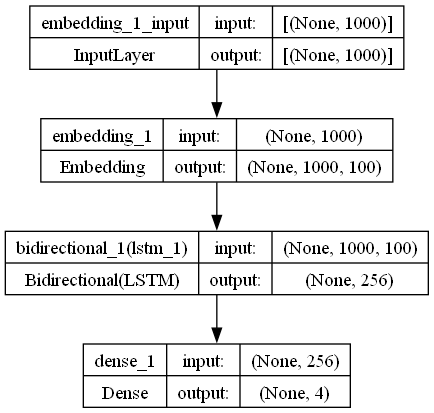

In [90]:
#plot the diagram for the structure of the final model:
# Plot the model
plot_model(final_model_lstm, to_file='lstm_model.png', show_shapes=True, show_layer_names=True)

In [201]:
print(f'Best Model Accuracy: {accuracy_lstm * 100:.2f}%')
y_pred_classes_lstm = np.argmax(y_pred_lstm, axis=1)
classification_rep_lstm = classification_report(y_holdout, y_pred_classes_lstm)
print("Classification Report:")
print(classification_rep_lstm)

Best Model Accuracy: 88.15%
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.90      0.92       128
           1       0.94      0.78      0.86       130
           2       0.76      0.91      0.83        92
           3       0.88      0.92      0.90       190

    accuracy                           0.88       540
   macro avg       0.88      0.88      0.88       540
weighted avg       0.89      0.88      0.88       540



In [165]:
categories={'art_music','food', 'history', 'travel'}

In [164]:
y_train

array([0, 3, 0, ..., 3, 2, 2], dtype=int64)

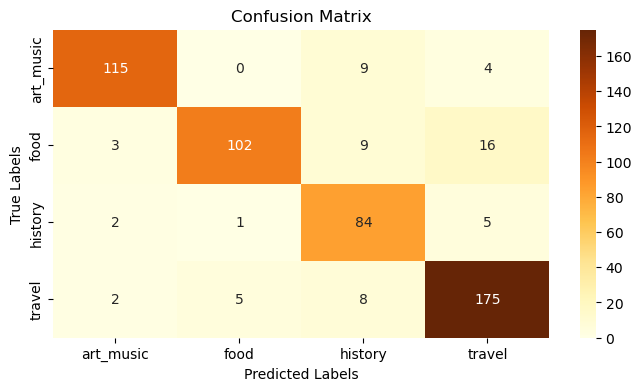

In [168]:
categories = ['art_music', 'food', 'history', 'travel']

predicted_classes_lstm = np.argmax(y_pred_lstm, axis=1)
true_classes = y_holdout

# Create confusion matrix
cm_lstm = confusion_matrix(true_classes, predicted_classes_lstm)

# Plot confusion matrix with correct category order
plt.figure(figsize=(8, 4))
sns.heatmap(cm_lstm, annot=True, fmt="d", cmap="YlOrBr", xticklabels=categories, yticklabels=categories)

plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

## GRU BASE MODEL

In [104]:
directory_to_delete = 'keras_tuner_dir_gru'
shutil.rmtree(directory_to_delete)

In [106]:
def build_model_gru(hp):
    model_gru = Sequential()
    vectorization_type = hp.Choice('vectorization_type', values=['embedding', 'glove'])
    
    if vectorization_type == 'embedding':
        max_words = hp.Choice('max_words_embedding', values=[50000, 100000])
        embedding_dim = hp.Choice('embedding_dim_embedding', values=[50, 100])
        print(f'Embedding case - max_words: {max_words}, embedding_dim: {embedding_dim}')
        model_gru.add(Embedding(input_dim=max_words,
                            output_dim=embedding_dim,
                            input_length=max_sequence_length))
    else:
        max_words = 400000
        embedding_dim = 50
        print(f'Glove case - max_words: {max_words}, embedding_dim: {embedding_dim}')
        model_gru.add(Embedding(input_dim=max_words,
                                 output_dim=embedding_dim,
                                 weights=[embedding_matrix],  # Set the pre-trained weights
                                 input_length=max_sequence_length,
                                 trainable=False)) # Set trainable to True if you want to fine-tune embeddings
    
    model_gru.add(Bidirectional(GRU(units=hp.Choice('gru_units', values=[32,64,128]),
                                return_sequences=False,
                                dropout=hp.Choice('dropout', values=[0.3, 0.5]),
                                recurrent_dropout=hp.Choice('recurrent_dropout', values=[0.3, 0.5]))))
    
    model_gru.add(Dense(units=4, activation="softmax"))

    model_gru.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    return model_gru

tuner_gru = RandomSearch(
    build_model_gru,
    objective='val_accuracy',
    max_trials=10,
    directory='keras_tuner_dir_gru',
    project_name='gru_hyperparameter_tuning'
)
n_folds = 5  

kf = KFold(n_splits=n_folds, shuffle=True, random_state=42)

for fold, (train_index, val_index) in enumerate(kf.split(X_train_padded, y_train)):
    train_data_fold, train_labels_fold = X_train_padded[train_index], y_train[train_index]
    val_data_fold, val_labels_fold = X_train_padded[val_index], y_train[val_index]
    tuner_gru.search(train_data_fold, train_labels_fold, epochs=5, validation_data=(val_data_fold, val_labels_fold), batch_size=64)


Trial 8 Complete [01h 19m 15s]
val_accuracy: 0.8273809552192688

Best val_accuracy So Far: 0.8492063283920288
Total elapsed time: 08h 19m 39s

Search: Running Trial #9

Value             |Best Value So Far |Hyperparameter
glove             |glove             |vectorization_type
50000             |50000             |max_words_embedding
100               |50                |embedding_dim_embedding
128               |128               |gru_units
0.3               |0.3               |dropout
0.3               |0.3               |recurrent_dropout

Glove case - max_words: 400000, embedding_dim: 50
Epoch 1/5
32/32 [==============================] - 1021s 32s/step - loss: 1.1583 - accuracy: 0.4834 - val_loss: 0.9047 - val_accuracy: 0.6409
Epoch 2/5
21/32 [==================>...........] - ETA: 4:47 - loss: 0.8075 - accuracy: 0.6801

KeyboardInterrupt: 

In [107]:
best_hps_gru = tuner_gru.get_best_hyperparameters(num_trials=1)[0]

final_model_gru = tuner_gru.hypermodel.build(best_hps_gru)

Glove case - max_words: 400000, embedding_dim: 50


In [108]:
final_model_gru.fit(X_train_padded, y_train, epochs=5)
y_pred_gru = final_model_gru.predict(X_holdout_padded)

accuracy_gru = final_model_gru.evaluate(X_holdout_padded, y_holdout)[1]
print(f'Best Model Accuracy: {accuracy_gru * 100:.2f}%')

Epoch 1/5
79/79 [==============================] - 1298s 16s/step - loss: 1.0322 - accuracy: 0.5677
Epoch 2/5
79/79 [==============================] - 1421s 18s/step - loss: 0.6070 - accuracy: 0.7737
Epoch 3/5
79/79 [==============================] - 1381s 17s/step - loss: 0.5172 - accuracy: 0.8150
Epoch 4/5
79/79 [==============================] - 1115s 14s/step - loss: 0.4762 - accuracy: 0.8285
Epoch 5/5
17/17 [==============================] - 21s 1s/step - loss: 0.5182 - accuracy: 0.8296
Best Model Accuracy: 82.96%


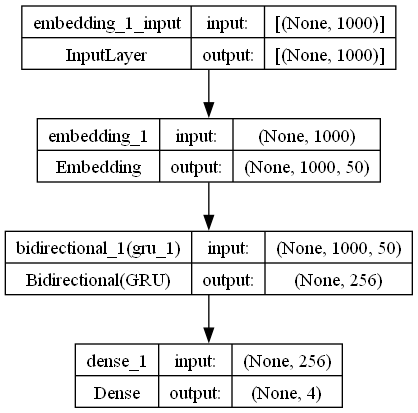

In [109]:
#plot the diagram for the structure of the final model:
# Plot the model
plot_model(final_model_gru, to_file='gru_model.png', show_shapes=True, show_layer_names=True)

In [202]:
y_pred_classes_gru = np.argmax(y_pred_gru, axis=1)

classification_rep_gru = classification_report(y_holdout,y_pred_classes_gru)
print("Classification Report:")
print(classification_rep_gru)

Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.94      0.84       128
           1       0.81      0.90      0.85       130
           2       0.87      0.79      0.83        92
           3       0.89      0.73      0.80       190

    accuracy                           0.83       540
   macro avg       0.83      0.84      0.83       540
weighted avg       0.84      0.83      0.83       540



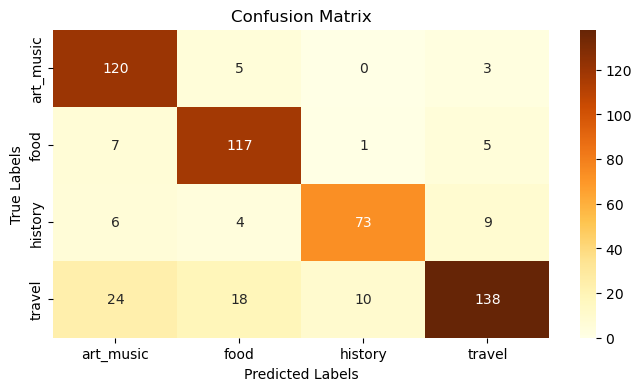

In [169]:
categories = ['art_music', 'food', 'history', 'travel']
predicted_classes_gru = np.argmax(y_pred_gru, axis=1)
true_classes=y_holdout
cm_gru = confusion_matrix(true_classes, predicted_classes_gru)
plt.figure(figsize=(8,4))
sns.heatmap(cm_gru, annot=True, fmt="d", cmap="YlOrBr", xticklabels=categories, yticklabels=categories)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

## META MODEL: XGBOOST

In [115]:
from scipy.stats import randint, uniform
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV
# unire le predictions
X_holdout_stacked = np.concatenate((y_pred_gru, y_pred_lstm), axis=1)

# Define the hyperparameters to search over
param_dist = {
    'max_depth': randint(3, 6),
    'learning_rate': uniform(0.001, 0.1),
    'n_estimators': randint(50, 200),
    'min_child_weight': randint(1, 5)
}

# Create the XGBoost model
xgb_model = xgb.XGBClassifier()

# Perform the random search to find the best comb
random_search = RandomizedSearchCV(xgb_model, param_distributions=param_dist, cv=5, n_iter=10)
random_search.fit(X_holdout_stacked, y_holdout)

print(f"The best hyperparameters are: {random_search.best_params_}")


The best hyperparameters are: {'learning_rate': 0.09924649357716153, 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 157}


In [116]:
# Fit the XGBoost model with the best hyperparameters
best_xgb_model = xgb.XGBClassifier(**random_search.best_params_)
best_xgb_model.fit(X_holdout_stacked, y_holdout)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09924649357716153,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=4, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=157, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [130]:
y_pred_gru_test = final_model_gru.predict(X_test_padded)
y_pred_lstm_test = final_model_lstm.predict(X_test_padded)
X_test_stacked = np.concatenate((y_pred_gru_test, y_pred_lstm_test), axis=1)
y_pred_xgb = best_xgb_model.predict(X_test_stacked)

#Accuracy on test data
accuracy = accuracy_score(y_test, y_pred_xgb)

17/17 [==============================] - 46s 3s/step


In [217]:
# classification report
y_pred_classes_xgb = np.argmax(y_pred_xgb, axis=1)
classification_rep_xgb = classification_report(y_test,y_pred_classes_xgb)
report = classification_report(y_test, y_pred_classes_xgb)
print(f"The classification report is:\n{classification_rep_xgb}")

The classification report is:
              precision    recall  f1-score   support

           0       0.82      0.94      0.87       129
           1       0.88      0.90      0.89       134
           2       0.97      0.85      0.91        87
           3       0.92      0.87      0.89       190

    accuracy                           0.89       540
   macro avg       0.90      0.89      0.89       540
weighted avg       0.90      0.89      0.89       540



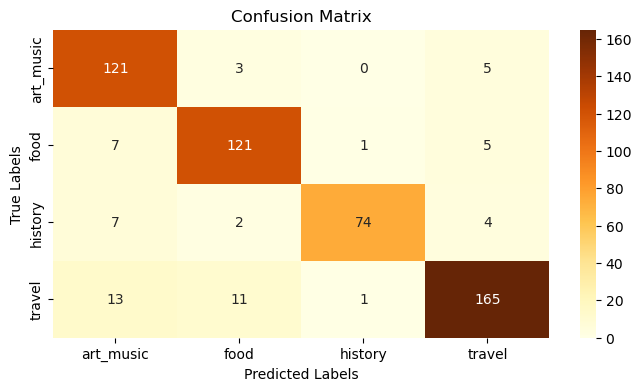

In [170]:
categories = ['art_music', 'food', 'history', 'travel']
predicted_classes_xgb = np.argmax(y_pred_xgb, axis=1)
true_classes=y_test
cm_xgb = confusion_matrix(true_classes, predicted_classes_xgb)
plt.figure(figsize=(8,4))
sns.heatmap(cm_xgb, annot=True, fmt="d", cmap="YlOrBr", xticklabels=categories, yticklabels=categories)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

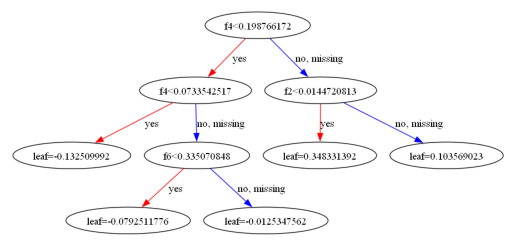

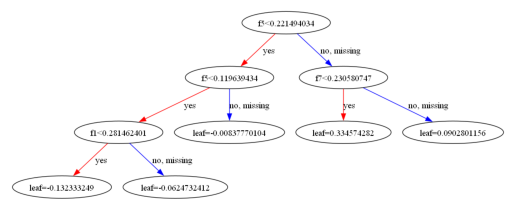

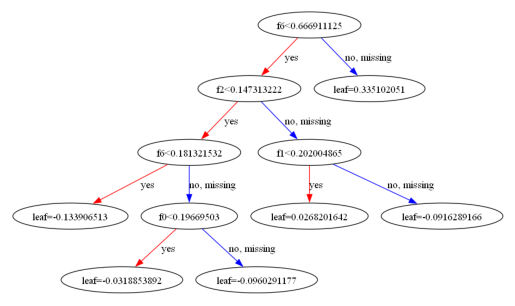

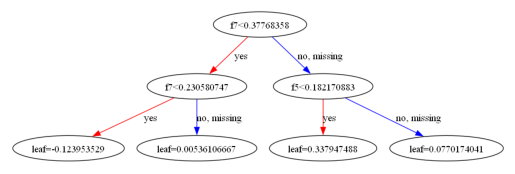

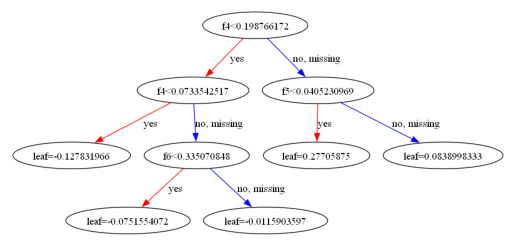

...

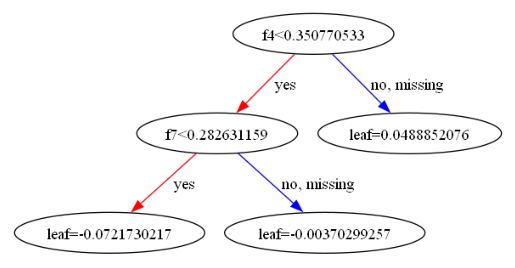

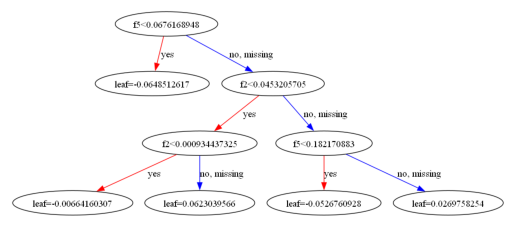

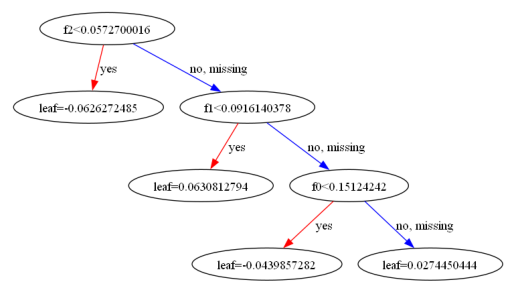

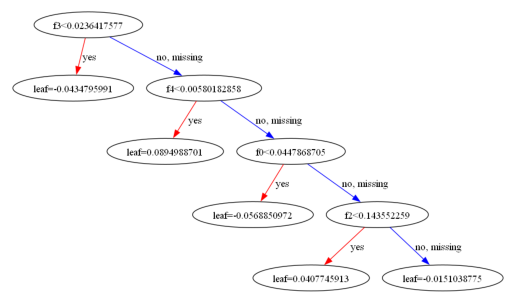

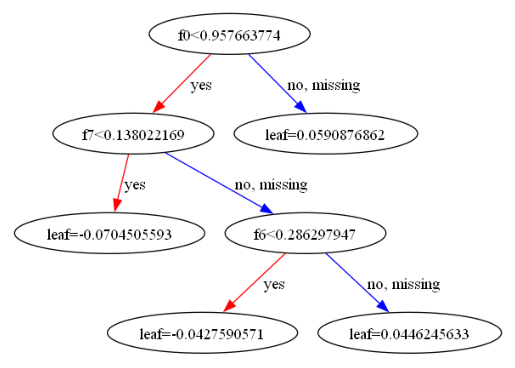

In [133]:
#plot the diagram for the structure of the final model:
# Plot the model
from xgboost import plot_tree

for i in range(best_xgb_model.n_estimators):
    plot_tree(best_xgb_model, num_trees=i)
    plt.show()

## BERT MODEL

In [135]:
from sklearn.preprocessing import MultiLabelBinarizer

mlb = MultiLabelBinarizer()

# Assuming y_train, y_holdout, and y_test are lists of lists or arrays of sets
y_train_encoded = mlb.fit_transform(y_train)
y_holdout_encoded = mlb.transform(y_holdout)
y_test_encoded = mlb.transform(y_test)

In [139]:
y_train = np.argmax(y_train, axis=1)
y_holdout = np.argmax(y_holdout, axis=1)
y_test= np.argmax(y_test, axis=1)

In [ ]:
# Label Encoding
label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(y_train)
y_holdout = label_encoder.fit_transform(y_holdout)
y_test = label_encoder.transform(y_test)

In [147]:
#Tokenization
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')

def tokenize_data(texts, labels, max_length=128):
    tokenized = tokenizer(texts.tolist(), truncation=True, padding=True, max_length=max_length, return_tensors='tf')
    
    # Convert BatchEncoding to a tuple of NumPy arrays
    tokenized_tuple = (
        np.array(tokenized['input_ids']),
        np.array(tokenized['attention_mask']),
    )
    
    labels = tf.convert_to_tensor(labels)
    return tokenized_tuple, labels


train_inputs, train_labels = tokenize_data(X_train, y_train)
train_holdout, train_holdout = tokenize_data(X_holdout, y_holdout)
test_inputs, _ = tokenize_data(X_test, y_test)

#model
bert_model = TFDistilBertForSequenceClassification.from_pretrained('distilbert-base-uncased', num_labels=4)

#compilation of the model
bert_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=2e-5),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


epochs = 3
batch_size = 16

history = bert_model.fit(
    train_inputs,
    train_labels,
    validation_data=(holdout_inputs, holdout_labels),
    epochs=epochs,
    batch_size=batch_size
)


Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFDistilBertForSequenceClassification: ['vocab_transform.weight', 'vocab_layer_norm.bias', 'vocab_transform.bias', 'vocab_layer_norm.weight', 'vocab_projector.bias']
- This IS expected if you are initializing TFDistilBertForSequenceClassification from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertForSequenceClassification from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
Some weights or buffers of the TF 2.0 model TFDistilBertForSequenceClassification were not initialized from the PyTorch model and are newly initialized: ['pre_classifier.weight', 'pre_classifier.bias', 'classifier.weight', 'classifier.bias']
You should 

Epoch 1/3
158/158 [==============================] - 2693s 17s/step - loss: 0.6890 - accuracy: 0.7630 - val_loss: 0.4026 - val_accuracy: 0.8648
Epoch 2/3
158/158 [==============================] - 2271s 14s/step - loss: 0.2753 - accuracy: 0.9158 - val_loss: 0.3301 - val_accuracy: 0.8833
Epoch 3/3
158/158 [==============================] - 2372s 15s/step - loss: 0.1595 - accuracy: 0.9532 - val_loss: 0.3399 - val_accuracy: 0.8944


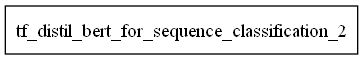

In [148]:
#plot the diagram for the structure of the final model:
# Plot the model
plot_model(bert_model, to_file='bert_model.png', show_shapes=True, show_layer_names=True)

In [188]:
# Predictions on Test Data
test_predictions_bert = model.predict(test_inputs)
test_predictions_bert

17/17 [==============================] - 129s 8s/step


TFSequenceClassifierOutput(loss=None, logits=array([[-1.1726578 , -1.7055969 ,  3.9093833 , -1.8008312 ],
       [-2.4007308 ,  3.5965707 , -1.9563779 , -0.17783138],
       [ 4.7077556 , -1.5652959 , -1.6628429 , -1.3367637 ],
       ...,
       [ 3.337579  , -1.206847  , -1.6942425 , -0.3659025 ],
       [ 4.7065687 , -1.601913  , -1.6465366 , -1.3480736 ],
       [-2.101734  ,  3.8559039 , -1.7887174 , -0.92328215]],
      dtype=float32), hidden_states=None, attentions=None)

In [190]:
# Extract logits from TFSequenceClassifierOutput
logits_bert = test_predictions_bert.logits

# Convert logits to predicted classes
predicted_classes_bert = np.argmax(logits_bert, axis=-1)

In [191]:
predicted_classes_bert

array([2, 1, 0, 1, 1, 3, 0, 1, 1, 3, 2, 3, 0, 2, 2, 3, 0, 3, 3, 3, 3, 3,
       2, 2, 2, 3, 1, 0, 3, 0, 2, 0, 3, 0, 0, 0, 3, 0, 1, 3, 1, 0, 3, 2,
       0, 3, 0, 1, 0, 2, 0, 0, 1, 3, 3, 0, 0, 3, 3, 2, 2, 3, 1, 2, 3, 0,
       1, 1, 3, 0, 1, 2, 1, 1, 0, 3, 2, 3, 1, 2, 3, 3, 1, 0, 3, 2, 0, 3,
       0, 2, 3, 2, 1, 3, 3, 2, 1, 1, 1, 0, 0, 3, 0, 1, 0, 2, 3, 2, 3, 0,
       1, 1, 3, 3, 0, 3, 1, 1, 1, 1, 2, 1, 1, 3, 2, 1, 0, 0, 2, 1, 1, 3,
       1, 1, 1, 3, 2, 1, 0, 3, 3, 1, 0, 1, 2, 3, 3, 0, 2, 0, 0, 3, 3, 3,
       0, 0, 0, 1, 2, 2, 1, 3, 3, 3, 3, 2, 0, 0, 1, 3, 1, 0, 1, 1, 3, 2,
       1, 1, 3, 3, 1, 2, 2, 3, 3, 3, 0, 0, 1, 0, 0, 3, 2, 3, 3, 3, 0, 3,
       2, 3, 0, 2, 3, 0, 1, 3, 0, 1, 1, 3, 1, 1, 3, 3, 3, 2, 0, 3, 2, 1,
       3, 3, 2, 3, 0, 0, 0, 2, 2, 0, 1, 2, 3, 1, 0, 0, 0, 3, 3, 1, 1, 1,
       0, 0, 2, 2, 3, 0, 0, 2, 3, 2, 3, 0, 1, 1, 0, 3, 0, 1, 3, 2, 3, 1,
       1, 1, 2, 2, 2, 3, 2, 1, 3, 0, 0, 1, 1, 0, 3, 1, 3, 3, 0, 2, 3, 0,
       0, 0, 3, 1, 0, 2, 1, 0, 1, 1, 2, 2, 2, 0, 0,

In [193]:
# Convert one-hot encoded labels to class indices
y_test = np.argmax(y_test, axis=1)
accuracy_bert = accuracy_score(y_test, predicted_classes_bert)
print(f"Accuracy: {accuracy_bert * 100:.2f}%")

Accuracy: 92.59%


In [195]:
classification_rep_bert = classification_report(y_test, predicted_classes_bert)
print("Classification Report:")
print(classification_rep_bert)

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.96      0.95       129
           1       0.93      0.91      0.92       134
           2       0.88      0.94      0.91        87
           3       0.94      0.91      0.92       190

    accuracy                           0.93       540
   macro avg       0.92      0.93      0.93       540
weighted avg       0.93      0.93      0.93       540



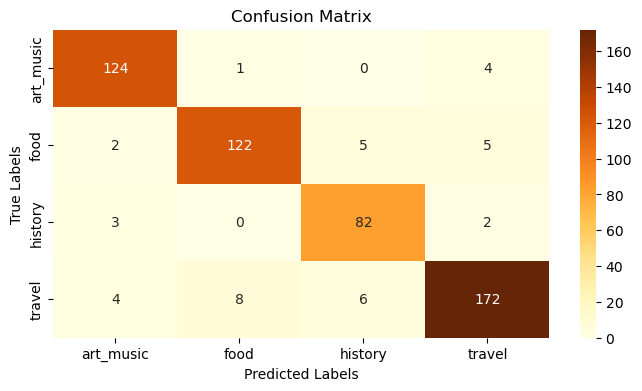

In [197]:
categories = ['art_music', 'food', 'history', 'travel']
true_classes = y_test
cm_bert = confusion_matrix(true_classes, predicted_classes_bert)
plt.figure(figsize=(8,4))
sns.heatmap(cm_bert, annot=True, fmt="d", cmap="YlOrBr", xticklabels=categories, yticklabels=categories)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()